<a href="https://colab.research.google.com/github/jcmachicao/deeplearning_gestionpublica/blob/main/gdmk__mod_edusuptec_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Liberías y Rutas

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

In [13]:
import plotly.express as px

In [ ]:
ruta = 'drive/My Drive/00 data/'
os.listdir(ruta)

In [3]:
#data_archivo = 'bd_proyectos_piura.csv'
data_archivo = 'bd_titulos.xlsx'

In [5]:
#data = pd.read_csv(ruta + data_archivo, encoding="latin1")
#data = pd.read_excel(ruta + data_archivo, sheet_name='Data')
data = pd.read_pickle(ruta + 'bd_titulos.pkl')

## Data

In [ ]:
data.to_pickle(ruta + 'bd_titulos.pkl')

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 136062 entries, 0 to 136061
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   CODIGO_MODULAR  136062 non-null  int64         
 1   institucion     136062 non-null  object        
 2   depar           136030 non-null  object        
 3   pub_priv        136062 non-null  object        
 4   tipo            136062 non-null  object        
 5   f_emision       136062 non-null  datetime64[ns]
 6   f_cod           136062 non-null  datetime64[ns]
 7   cod_titulo      136062 non-null  object        
 8   fam_prod        136062 non-null  object        
 9   carrera         136062 non-null  object        
 10  nivel           136062 non-null  object        
dtypes: datetime64[ns](2), int64(1), object(8)
memory usage: 11.4+ MB


In [7]:
data = data.astype({'institucion':'object', 'depar':'category', 'pub_priv':'category', 'tipo':'category', 'fam_prod':'category', 'carrera':'category', 'nivel':'category'})
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 136062 entries, 0 to 136061
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   CODIGO_MODULAR  136062 non-null  int64         
 1   institucion     136062 non-null  object        
 2   depar           136030 non-null  category      
 3   pub_priv        136062 non-null  category      
 4   tipo            136062 non-null  category      
 5   f_emision       136062 non-null  datetime64[ns]
 6   f_cod           136062 non-null  datetime64[ns]
 7   cod_titulo      136062 non-null  object        
 8   fam_prod        136062 non-null  category      
 9   carrera         136062 non-null  category      
 10  nivel           136062 non-null  category      
dtypes: category(6), datetime64[ns](2), int64(1), object(2)
memory usage: 6.1+ MB


In [ ]:
for col in data.columns:
  if data[col].dtype == 'category':
    print('*** ', col)
    print(data[col].value_counts())

In [9]:
from numpy import less_equal
outindex = []
for i, v in zip ( data.carrera.value_counts().index, data.carrera.value_counts() ):
  if less_equal(v, 50):
    outindex.append(i)

In [10]:
keepindex = list(data.carrera.unique())
keepindex2 = list( set(keepindex) - set(outindex) )

## data1XX: filtrado de valores

In [11]:
data100 = data[data.carrera.isin(keepindex2)]
data100.shape, data.shape

((134496, 11), (136062, 11))

In [12]:
data105 = data100.dropna(axis=0)

In [14]:
data110 = data105[data105.nivel=='PROFESIONAL TÉCNICO']
data120 = data110[data110.tipo=='IEST']
data120.shape

(128474, 11)

In [15]:
data130 = data120.drop(['tipo', 'nivel', 'CODIGO_MODULAR', 'institucion', 'cod_titulo'], axis=1)
data130.shape

(128474, 6)

In [16]:
data130.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 128474 entries, 0 to 136061
Data columns (total 6 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   depar      128474 non-null  category      
 1   pub_priv   128474 non-null  category      
 2   f_emision  128474 non-null  datetime64[ns]
 3   f_cod      128474 non-null  datetime64[ns]
 4   fam_prod   128474 non-null  category      
 5   carrera    128474 non-null  category      
dtypes: category(4), datetime64[ns](2)
memory usage: 3.6 MB


In [17]:
data130['f_emision_dt'] = pd.to_datetime(data130.f_emision).dt.year * 12 + pd.to_datetime(data130.f_emision).dt.month
data130['f_cod_dt'] = pd.to_datetime(data130.f_cod).dt.year * 12 + pd.to_datetime(data130.f_cod).dt.month

In [18]:
data130['demora_otorga'] = np.abs(data130.f_cod_dt - data130.f_emision_dt)

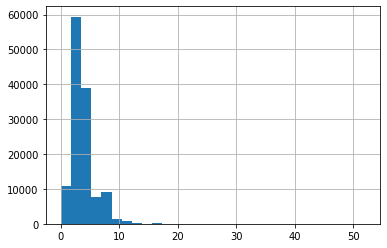

In [19]:
data130.demora_otorga.hist(bins=30)

In [53]:
data140 = data130.drop(['f_emision', 'f_emision_dt', 'f_cod', 'carrera'], axis=1)
data140.shape

(128474, 5)

In [54]:
px.parallel_categories(data140)

In [55]:
data140.columns

Index(['depar', 'pub_priv', 'fam_prod', 'f_cod_dt', 'demora_otorga'], dtype='object')

In [56]:
X_df = data140.drop('fam_prod', axis=1)
X_df_d = pd.get_dummies(X_df)

In [57]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
tree_model = DecisionTreeClassifier(max_depth=3)
tree_model.fit(X_df_d, data140.fam_prod)

DecisionTreeClassifier(max_depth=3)

In [58]:
tree_model.classes_

array(['ACTIVIDAD AUTOMOTRÍZ', 'ACTIVIDADES AGROPECUARIAS Y FORESTALES',
       'ADMINISTRACIÓN Y GESTIÓN PÚBLICA', 'COMERCIO MAYORISTA',
       'CONSTRUCCIÓN E INGENIERÍA CIVIL',
       'CULTURA, ENTRETENIMIENTO Y RECREACIÓN',
       'ENERGÍA, AGUA Y SANEAMIENTO', 'HOTELES Y RESTAURANTES',
       'INDUSTRIA ALIMENTARIA, BEBIDAS Y TABACO',
       'INDUSTRIA DE BIENES DE CAPITAL', 'INDUSTRIA DIVERSAS',
       'INDUSTRIA METAL MECÁNICA', 'INDUSTRIA QUÍMICA',
       'INDUSTRIA TEXTIL, CONFECCIÓN Y DEL CUERO',
       'INTERMEDIACIÓN FINANCIERA', 'MINERIA METÁLICA', 'PESCA',
       'SERVICIOS PERSONALES Y DE HOGARES',
       'SERVICIOS PRESTADOS A EMPRESAS', 'SERVICIOS SOCIALES Y DE SALUD',
       'TECNOLOGÍAS DE LA INFORMACIÓN Y COMUNICACIONES - TICS'],
      dtype=object)

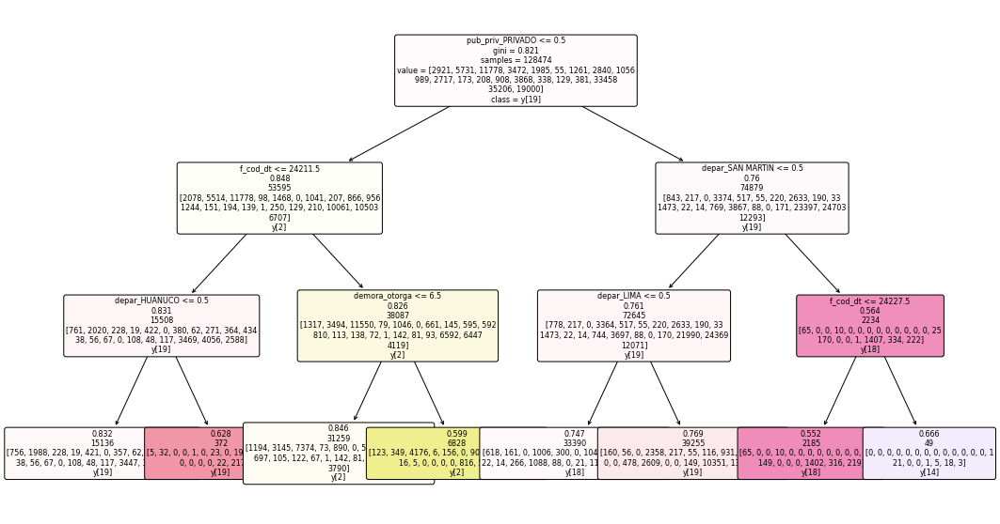

In [60]:
plt.figure(figsize=(18,10))
plot_tree(tree_model, max_depth=3, rounded=True, fontsize=8, label='root', filled=True, feature_names=X_df_d.columns, class_names=True)
plt.show()

In [61]:
data140.fam_prod.value_counts()

SERVICIOS SOCIALES Y DE SALUD                            35206
SERVICIOS PRESTADOS A EMPRESAS                           33458
TECNOLOGÍAS DE LA INFORMACIÓN Y COMUNICACIONES - TICS    19000
ADMINISTRACIÓN Y GESTIÓN PÚBLICA                         11778
ACTIVIDADES AGROPECUARIAS Y FORESTALES                    5731
INTERMEDIACIÓN FINANCIERA                                 3868
COMERCIO MAYORISTA                                        3472
ACTIVIDAD AUTOMOTRÍZ                                      2921
HOTELES Y RESTAURANTES                                    2840
INDUSTRIA DIVERSAS                                        2717
CONSTRUCCIÓN E INGENIERÍA CIVIL                           1985
ENERGÍA, AGUA Y SANEAMIENTO                               1261
INDUSTRIA ALIMENTARIA, BEBIDAS Y TABACO                   1056
INDUSTRIA DE BIENES DE CAPITAL                             989
INDUSTRIA TEXTIL, CONFECCIÓN Y DEL CUERO                   908
SERVICIOS PERSONALES Y DE HOGARES                      

In [62]:
from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()
X_np = mms.fit_transform(X_df_d)
y_np = pd.get_dummies(data140.fam_prod)
X_np.shape, y_np.shape, X_np.max()

((128474, 29), (128474, 25), 1.0)

In [64]:
rutaout = 'drive/My Drive/00 Modelos Principales/modelos gestion publica/'
np.save(rutaout+'X_np_edusuptec.npy', X_np)
np.save(rutaout+'y_np.edusuptecnpy', y_np)

In [65]:
data140.columns

Index(['depar', 'pub_priv', 'fam_prod', 'f_cod_dt', 'demora_otorga'], dtype='object')

In [67]:
px.scatter(data140, 'f_cod_dt', 'demora_otorga',
  color='pub_priv',
)